# Dash App Explore

The purpose of this notebook is to generate the map that includes physical boundaries and probability of a debris flow

- [create unique site data](#sites)

- [dash example](#example)

- [dash app](#dash)
    - [MVP](#mvp)

possibly helpful package for developing plot

https://pypi.org/project/jupyterlab-dash/



In [1]:
import pandas as pd
import geopandas as gpd
import numpy as np
# from dash import Dash, html, dcc, Input, Output
import json
import datetime

import plotly.express as px
# import plotly
# plotly.io.templates.default = 'plotly_dark'
from jupyter_dash import JupyterDash

In [2]:
# %pip install "jupyterlab>=3" "ipywidgets>=7.6"

In [3]:
# !jupyter lab

In [4]:
!jupyter --version

Selected Jupyter core packages...
IPython          : 8.10.0
ipykernel        : 6.19.2
ipywidgets       : 7.6.5
jupyter_client   : 7.4.9
jupyter_core     : 5.2.0
jupyter_server   : 1.23.4
jupyterlab       : 3.5.3
nbclient         : 0.5.13
nbconvert        : 6.5.4
nbformat         : 5.7.0
notebook         : 6.5.2
qtconsole        : 5.4.0
traitlets        : 5.7.1


In [5]:
# !jupyter labextension install jupyterlab-plotly

# Unique Site Data <a id="sites">

In [6]:
# final feature file
file = "../../data/data_v08_consolidated.parquet"
df = gpd.read_parquet(file)
df.head()

,SiteID,fire_id,fire_name,fire_segid,year,state,response,stormdate,gaugedist_m,lat,...,dnbr1000,kf,Fine fuel load,SAV,Packing ratio,Extinction moisture content,LNDS_RISKS,fire_interval,SedUn,SuscFrac
0,0,bck,Buckweed,bck_1035,2007,CA,0,2008-01-22,1998.67,34.542358,...,0.297853,0.250000,1.808258,1818.146903,0.002187,15.000000,96.305814,-1,0.000000,0.656167
1,1,bck,Buckweed,bck_1090,2007,CA,0,2008-01-22,2368.93,34.540093,...,0.224896,0.250000,1.384151,1821.989060,0.001839,15.000000,96.305814,-1,0.000000,0.271910
2,2,bck,Buckweed,bck_1570,2007,CA,0,2008-01-22,3956.74,34.528844,...,0.065537,0.248541,1.599649,1816.939332,0.002439,15.099213,96.305814,-1,0.026753,0.487114
3,3,bck,Buckweed,bck_235,2007,CA,0,2008-01-22,1734.72,34.558602,...,0.141711,0.250000,1.775339,1817.801690,0.002657,15.093254,96.305814,-1,0.000000,0.678739
4,4,bck,Buckweed,bck_363,2007,CA,0,2008-01-22,1801.04,34.554817,...,0.210158,0.250000,1.847506,1816.320840,0.002579,15.092942,96.305814,-1,0.000000,0.696387


In [7]:
# these are unique to each site

attribute_cols = [
    'SiteID', 
    'fire_id', 
    'fire_name', 
    'fire_segid', 
    'year',
    #'stormdate', # data of DF, good for plots
    'state',
    'lat', # needed for df location
    'lon', # needed for df location
    'geom', # need this to retain primary key for reading parquet (annoying)
    'geometry' # catchment area
]

In [9]:
# get the features

# open the parameters json
file_path = "../../app/model/model_parameters.json"
with open(file_path) as model_params:
    model_params = json.load(model_params)
    
architecture = 'ThreeLayer_500_epochs_optimized_roc_auc_score'
one_model = model_params[architecture]
features = one_model['features']
features

['peak_i15_mmh', 'fire_interval', 'kf', 'SuscFrac', 'SAV', 'prophm23', 'SedUn']

In [10]:
feat_subset = features.copy()
feat_subset.remove('peak_i15_mmh') # not unique, seed at zero
feat_subset.remove('fire_interval') # not unique, calculate from year to present
feat_subset

['kf', 'SuscFrac', 'SAV', 'prophm23', 'SedUn']

In [11]:
# these are duplicative
# get the most recent flow per site id
# will need to add on to our de-duped DF
flow_dates = df[['SiteID', 'stormdate']].rename(columns={'stormdate': 'flowdate'})
flow_dates = flow_dates.groupby(['SiteID'])['flowdate'].max()
flow_dates

SiteID
0      2008-01-22
1      2008-01-22
2      2008-01-22
3      2008-01-22
4      2008-01-22
          ...    
711    2011-09-07
712    2011-09-07
713    2011-09-07
714    2011-09-07
715    2011-09-07
Name: flowdate, Length: 693, dtype: object

We have multiple observations per site. However, for the final plot we only need one observation per site. Consolidate features to each site

- this is not filtering down
- should be 693 locations

### Dedupe

In [12]:
df_sites = df[attribute_cols + feat_subset].drop_duplicates(keep='first')
df_sites.shape

(693, 15)

### add flow dates

In [13]:
df_sites = pd.merge(df_sites, flow_dates, how='left', left_on='SiteID', right_on='SiteID')

### create rain metric again

In [14]:
# just for reference
print('min', df['peak_i15_mmh'].min())
print('max', df['peak_i15_mmh'].max())

min 0.0
max 120.97454630854091


In [15]:
# bring in a random small amount of rain
rand_rain = np.random.uniform(low=0.0, high=5.0, size=df_sites.shape[0])

df_sites['peak_i15_mmh'] = rand_rain

### create fire interval again using current year

In [16]:
df_sites['fire_interval'] = df_sites['year'] - datetime.datetime.now().year

### Simplify shapely geometry

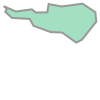

In [17]:
# calculate center of map for initializing to our data
map_center = {
    "lon": df_sites['geometry'].centroid.x.median(),
    "lat": df_sites['geometry'].centroid.y.median(),
}

# first need to simplify the shapely geometry
# how to simplify
tol = 0.00025
df_sites.loc[0,"geometry"].simplify(tol)

In [18]:
%%time
tol=0.00025
df_sites['geometry_simple'] = df_sites['geometry'].map(lambda x: x.simplify(tol))

CPU times: user 416 ms, sys: 6.12 ms, total: 422 ms
Wall time: 426 ms


In [19]:
# # drop the extra column
# # make the file a little lighter
# df_sites = df_sites.drop(['geometry'], axis=1)

In [20]:
# df_sites['geometry'].set_crs('epsg:4326')

In [21]:
# need to set coordinates reference system when reading or writing
df_sites['geometry_simple'] = df_sites['geometry_simple'].set_crs('epsg:4326')

*when reading in, something like this will be needed*
```python
df = pd.read_parquet(data_dir + "sites_v02_plot_data.parquet")
site_data = gpd.GeoDataFrame(df, geometry=gpd.GeoSeries.from_wkb(df['geometry_simple'], crs=4326))
```

In [22]:
# RESET INDEX
# since we dropped values
df_sites = df_sites.reset_index(drop=True)
df_sites.shape

(693, 19)

In [23]:
df_sites.columns

Index(['SiteID', 'fire_id', 'fire_name', 'fire_segid', 'year', 'state', 'lat',
       'lon', 'geom', 'geometry', 'kf', 'SuscFrac', 'SAV', 'prophm23', 'SedUn',
       'flowdate', 'peak_i15_mmh', 'fire_interval', 'geometry_simple'],
      dtype='object')

two locations for final files

In [24]:
# # write out file for flask app
# df_sites.to_parquet("../../data/sites_v02_plot_data.parquet")

In [25]:
# # write out file for flask app
# df_sites.to_parquet("../../app/data/sites_v02_plot_data.parquet")

## Plotly Choropleth

first build the figure that dash will deploy

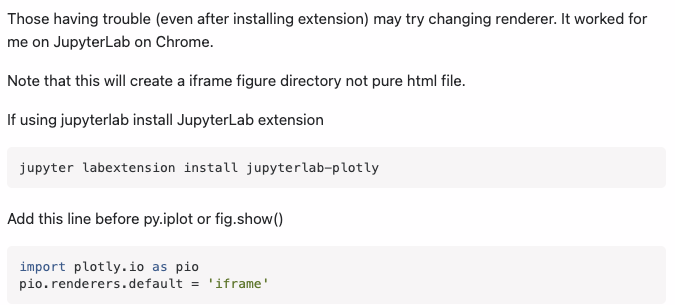

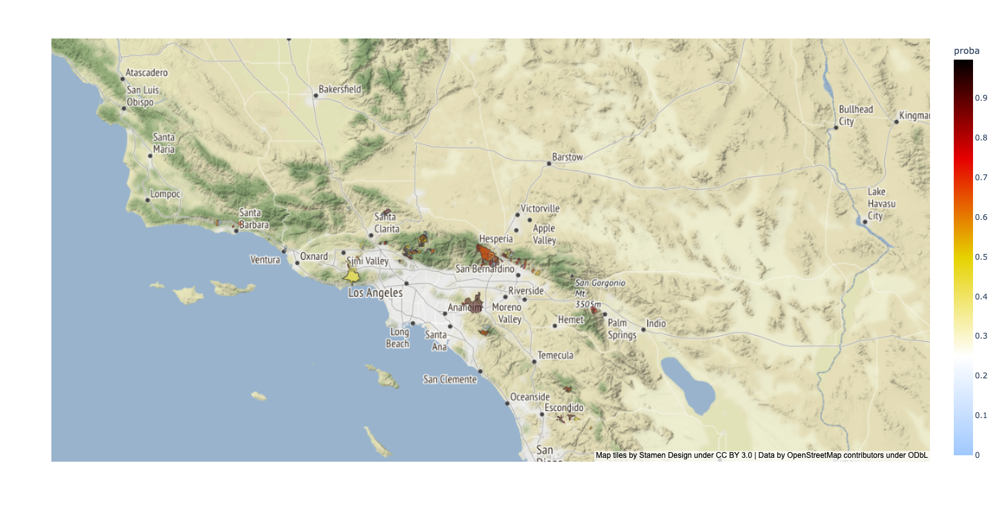

In [26]:
plot_df = df_sites.copy()
# bring in a random probability for testing
probas = np.random.uniform(low=0, high=1, size=plot_df.shape[0])
plot_df['proba'] = probas


# first the areas with probabilities
fig = px.choropleth_mapbox(
    plot_df,
    plot_df['geometry_simple'], # this is the area
    #featureidkey='geom',
    locations=plot_df.index, # needed to match all data correctly
    color='proba',
    #color_continuous_scale='OrRd',
    #color_continuous_scale='RdBu_r',
    color_continuous_scale='Blackbody_r',
    hover_name='state',
    hover_data=['SiteID', 'year'],
    center=map_center,
    mapbox_style='stamen-terrain',
    height=800,
    zoom=7,
    opacity=0.5, 
)
# might need `renderer='iframe'`
fig.show()

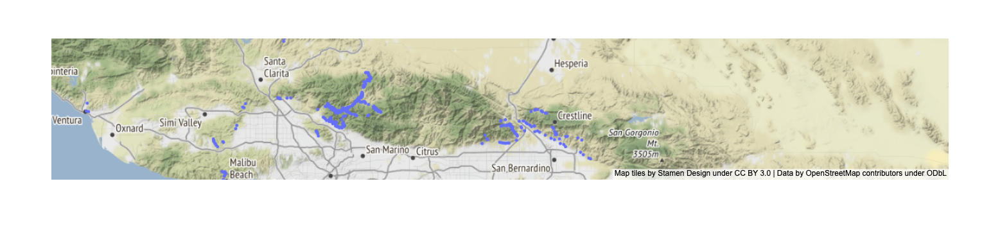

In [27]:
# now add the specific debris-flow locations 
fig2 = px.scatter_mapbox(
    plot_df,
    lat='lat', # point data
    lon='lon', # point data
    #color='Legend',
    color_discrete_map={'Debris-Flow': 'orange'},
    size_max=8,
    hover_data=['flowdate'],
    center=map_center,
    mapbox_style='stamen-terrain', # not needed when adding traces
)

# might need `renderer='iframe'`
fig2.show()

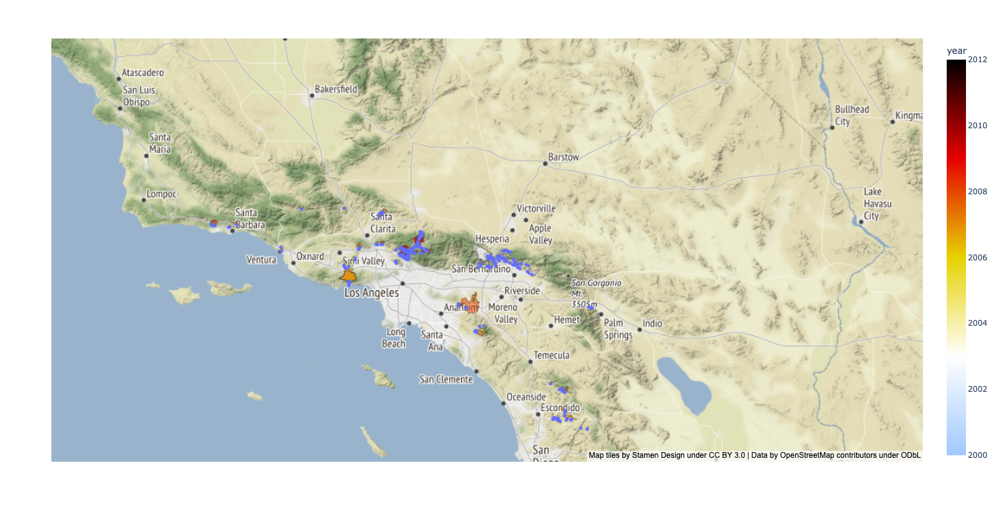

In [28]:
# combine the plots

# first the areas with probabilities
fig = px.choropleth_mapbox(
    plot_df,
    plot_df['geometry_simple'], # this is the area
    #featureidkey='geom',
    locations=plot_df.index, # needed to match all data correctly
    color='year',
    #color_continuous_scale='OrRd',
    #color_continuous_scale='RdBu_r',
    color_continuous_scale='Blackbody_r',
    hover_name='state',
    hover_data=['SiteID', 'year'],
    center=map_center,
    mapbox_style='stamen-terrain',
    height=800,
    zoom=7,
    opacity=0.5, 
)


# now add the specific debris-flow locations 
fig2 = px.scatter_mapbox(
    plot_df,
    lat='lat', # point data
    lon='lon', # point data
    color_discrete_map={'Debris-Flow': 'orange'},
    size_max=8,
    hover_data=['flowdate'], # it would be nice to have the data of the DF but we dropped in prior notebooks
    #mapbox_style='stamen-terrain', # not needed when adding traces
)

# combine plots
fig.add_traces(fig2.data)
# might need `renderer='iframe'`
fig.show()

In [28]:
# # bring in a random probability for testing
# probas = np.random.uniform(low=0, high=1, size=plot_df.shape[0])

# plot_df['proba'] = probas

In [20]:
help(px.choropleth_mapbox)

Help on function choropleth_mapbox in module plotly.express._chart_types:

choropleth_mapbox(data_frame=None, geojson=None, featureidkey=None, locations=None, color=None, hover_name=None, hover_data=None, custom_data=None, animation_frame=None, animation_group=None, category_orders=None, labels=None, color_discrete_sequence=None, color_discrete_map=None, color_continuous_scale=None, range_color=None, color_continuous_midpoint=None, opacity=None, zoom=8, center=None, mapbox_style=None, title=None, template=None, width=None, height=None) -> plotly.graph_objs._figure.Figure
        In a Mapbox choropleth map, each row of `data_frame` is represented by a
        colored region on a Mapbox map.
        
    Parameters
    ----------
    data_frame: DataFrame or array-like or dict
        This argument needs to be passed for column names (and not keyword
        names) to be used. Array-like and dict are transformed internally to a
        pandas DataFrame. Optional: if missing, a DataFrame 

In [32]:
help(px.scatter_mapbox)

Help on function scatter_mapbox in module plotly.express._chart_types:

scatter_mapbox(data_frame=None, lat=None, lon=None, color=None, text=None, hover_name=None, hover_data=None, custom_data=None, size=None, animation_frame=None, animation_group=None, category_orders=None, labels=None, color_discrete_sequence=None, color_discrete_map=None, color_continuous_scale=None, range_color=None, color_continuous_midpoint=None, opacity=None, size_max=None, zoom=8, center=None, mapbox_style=None, title=None, template=None, width=None, height=None) -> plotly.graph_objs._figure.Figure
        In a Mapbox scatter plot, each row of `data_frame` is represented by a
        symbol mark on a Mapbox map.
        
    Parameters
    ----------
    data_frame: DataFrame or array-like or dict
        This argument needs to be passed for column names (and not keyword
        names) to be used. Array-like and dict are transformed internally to a
        pandas DataFrame. Optional: if missing, a DataFrame get

In [21]:
# help(px.colors.sequential)
#https://plotly.com/python/builtin-colorscales/

In [22]:
import plotly.io as pio
pio.renderers

Renderers configuration
-----------------------
    Default renderer: 'plotly_mimetype+notebook'
    Available renderers:
        ['plotly_mimetype', 'jupyterlab', 'nteract', 'vscode',
         'notebook', 'notebook_connected', 'kaggle', 'azure', 'colab',
         'cocalc', 'databricks', 'json', 'png', 'jpeg', 'jpg', 'svg',
         'pdf', 'browser', 'firefox', 'chrome', 'chromium', 'iframe',
         'iframe_connected', 'sphinx_gallery', 'sphinx_gallery_png']

In [23]:
renders = [
    'notebook', # local
    'notebook_connected', # local
    'jupyterlab', # doesn't display
    'kaggle', # local
    'azure', # local
    'browser', # local (opens plot in new browser tab)
    'iframe', # docker, local (saves plot in `iframe_figures` folder)
    'iframe_connected', # docker, local (saves plot in `iframe_figures` folder)
    'colab' # docker
]


render = renders[6]
render

'iframe'

In [24]:
fig = px.choropleth_mapbox(
    plot_df,
    plot_df['geometry_simple'],
    locations=plot_df['SiteID'],
    color='proba',
    #color_continuous_scale='OrRd',
    #color_continuous_scale='RdBu_r',
    color_continuous_scale='Blackbody_r',
    hover_data=['SiteID'],
    center=map_center,
    mapbox_style='stamen-terrain',
    height=800,
    zoom=7,
    opacity=0.5 
)

# doesn't open in jupyterlab
# need to download and open to test
#fig.write_html("test_plot.html")

# not displaying
fig.show(render)

## Build Dash app

https://plotly.com/python/getting-started/#jupyterlab-support-python-35
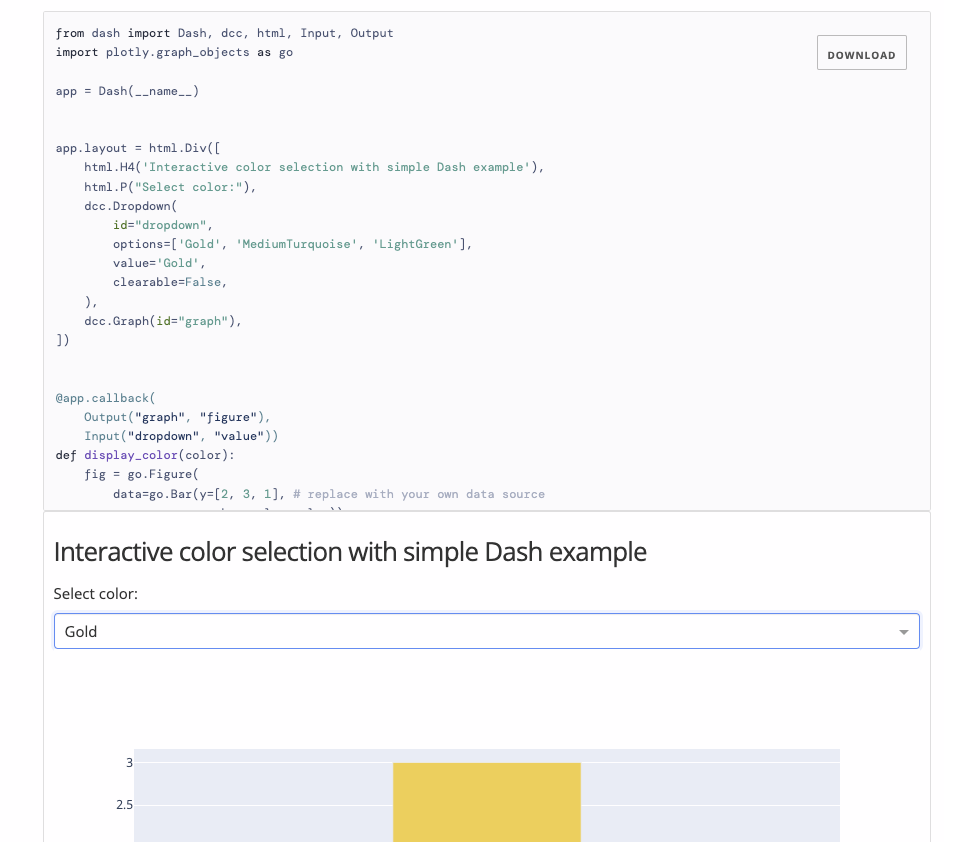

# Dash with Callback <a id='example'>
- text box input
https://dash.plotly.com/basic-callbacks
    
    
    
- post on displaying within jupyterlab
    
    
    
```python
from dash import Dash, dcc, html, Input, Output

app = Dash(__name__)

app.layout = html.Div([
    html.H6("Change the value in the text box to see callbacks in action!"),
    html.Div([
        "Input: ",
        dcc.Input(id='my-input', value='initial value', type='text')
    ]),
    html.Br(),
    html.Div(id='my-output'),

])


@app.callback(
    Output(component_id='my-output', component_property='children'),
    Input(component_id='my-input', component_property='value')
)
def update_output_div(input_value):
    return f'Output: {input_value}'


if __name__ == '__main__':
    app.run_server(debug=True)
```

In [28]:
# %pip install jupyter-dash

In [34]:
# import webbrowser

In [32]:
# %pip install chardet==5.1.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 199.1/199.1 kB 6.5 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [29]:
# EXAMPLE

from dash import Dash, dcc, html, Input, Output

#app = Dash(__name__)
app = JupyterDash(__name__)

app.layout = html.Div([
    html.H6("Change the value in the text box to see callbacks in action!"),
    html.Div([
        "Input: ",
        dcc.Input(id='my-input', value='initial value', type='text')
    ]),
    html.Br(),
    html.Div(id='my-output'),

])


@app.callback(
    Output(component_id='my-output', component_property='children'),
    Input(component_id='my-input', component_property='value')
)
def update_output_div(input_value):
    return f'Output: {input_value}'


if __name__ == '__main__':
    app.run_server(
        debug=True,
        mode='inline',
        #host='localhost',
        #port=8090,
        #dev_tools_ui=True, 
        #debug=True,
        #dev_tools_hot_reload =True, 
        #threaded=True,
    )
#webbrowser.open("http://localhost:8050/")

Dash is running on http://127.0.0.1:8050/



# Dash app <a id='dash'>
## Load in model and data

In [32]:
# load in the model class
from sys import path
path.append("../../app/model/")
import ModelNN as Net
import torch
import pandas as pd
import pickle
from sklearn.preprocessing import StandardScaler
import geopandas as gpd

#intialize values
seed=27
data_dir = '../../data/'
model_dir = '../../app/model/'
architecture = 'ThreeLayer_500_epochs_optimized_roc_auc_score' # use whichever model name desired
peak_mmh = 'peak_i15_mmh'


# open the parameters json
file_name = "model_parameters.json"
with open(model_dir + file_name) as model_params:
    model_params = json.load(model_params)
# load in model parameters
one_model = model_params[architecture]

# should turn this into a function
input_size = len(one_model['features'])
hidden_size = one_model['hidden_size']
dropout_rate = one_model['dropout_rate']
output_size = 1

# this is not programmatic
model_class = one_model['model_class']
# load feature set
features = one_model['features']
# load trained model weights file_name
weights = one_model['weights']

# set device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
# instantiate model
with torch.no_grad(): # turn off gradiants for inference
    if model_class == 'OneLayer':
        model = Net.OneLayer(input_size, hidden_size, output_size, dropout_rate).to(device)
    elif model_class == 'TwoLayer':
        model = Net.TwoLayer(input_size, hidden_size, output_size, dropout_rate).to(device)
    elif model_class == 'ThreeLayer':
        model = Net.ThreeLayer(input_size, hidden_size, output_size, dropout_rate).to(device)
    model.eval() # turn off dropout etc for inference
# load weights/biases
model.load_state_dict(torch.load(model_dir + weights, map_location=device))

# LOAD IN DATA
# needed to scale to training set
X_train_df, X_test_df, y_train_df, y_test_df = pickle.load(open(data_dir + "train_test_data.pkl", "rb"))
X_train_df, X_test_df = X_train_df[features], X_test_df[features]

# scale on the training set
sc = StandardScaler()
X_train_scaled = pd.DataFrame(sc.fit_transform(X_train_df))

# now load in all the data
#site_data = gpd.read_parquet(data_dir + "sites_v02_plot_data.parquet") # ERROR
site_data = df_sites.copy()

# fit the data to the scaler
X_scaled = pd.DataFrame(sc.transform(site_data[features]))
# X_test_scaled = pd.DataFrame(sc.transform(X_test_df))

# could also do the whole dataset
# want to examine just the test predictions now
X_scaled_tensor = torch.tensor(X_scaled.values).float().to(device)
y_pred_tensor = model(X_scaled_tensor) # already sent to device when instantiated
y_pred_proba = y_pred_tensor.detach().cpu().numpy().astype(np.float16) # smaller dtype
y_pred_bool = np.round(y_pred_proba)
print('loaded')

loaded


In [33]:
import seaborn as sns

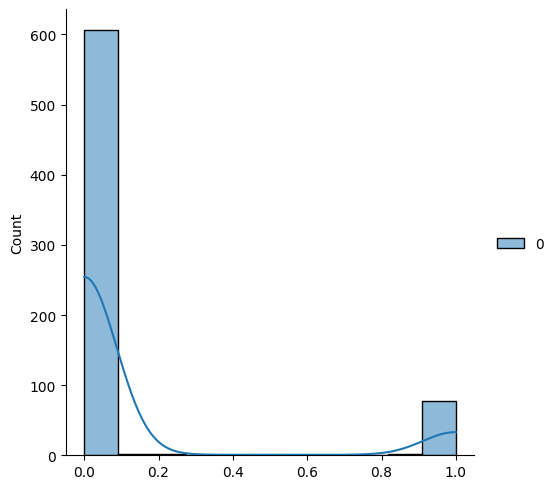

In [34]:
sns.displot(data=y_pred_proba, kde=True);

In [37]:
# load in the model class
from sys import path
path.append("../../model/")
import ModelNN as Net
import torch
import pandas as pd
import pickle
from sklearn.preprocessing import StandardScaler
import geopandas as gpd

#intialize values
seed=27
data_dir = '../../data/'
model_dir = '../../app/model/'
architecture = 'ThreeLayer_500_epochs_optimized_roc_auc_score' # use whichever model name desired
peak_mmh = 'peak_i15_mmh'


# open the parameters json
file_name = "model_parameters.json"
with open(model_dir + file_name) as model_params:
    model_params = json.load(model_params)
# load in model parameters
one_model = model_params[architecture]

# should turn this into a function
input_size = len(one_model['features'])
hidden_size = one_model['hidden_size']
dropout_rate = one_model['dropout_rate']
output_size = 1

# this is not programmatic
model_class = one_model['model_class']
# load feature set
features = one_model['features']
# load trained model weights file_name
weights = one_model['weights']

# set device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
# instantiate model
with torch.no_grad(): # turn off gradiants for inference
    if model_class == 'OneLayer':
        model = Net.OneLayer(input_size, hidden_size, output_size, dropout_rate).to(device)
    elif model_class == 'TwoLayer':
        model = Net.TwoLayer(input_size, hidden_size, output_size, dropout_rate).to(device)
    elif model_class == 'ThreeLayer':
        model = Net.ThreeLayer(input_size, hidden_size, output_size, dropout_rate).to(device)
    model.eval() # turn off dropout etc for inference
# load weights/biases
model.load_state_dict(torch.load(model_dir + weights, map_location=device))


# LOAD IN DATA
# needed to scale to training set
X_train_df, X_test_df, y_train_df, y_test_df = pickle.load(open(data_dir + "train_test_data.pkl", "rb"))
X_train_df, X_test_df = X_train_df[features], X_test_df[features]

# scale on the training set
sc = StandardScaler()
X_train_scaled = pd.DataFrame(sc.fit_transform(X_train_df))

# now load in all the data
#site_data = gpd.read_parquet(data_dir + "sites_v02_plot_data.parquet") # ERROR
site_data = df_sites.copy()

# fit the data to the scaler
X_scaled = pd.DataFrame(sc.transform(site_data[features]))
# X_test_scaled = pd.DataFrame(sc.transform(X_test_df))

# make prediction for every site
X_scaled_tensor = torch.tensor(X_scaled.values).float().to(device)
y_pred_tensor = model(X_scaled_tensor) # already sent to device when instantiated
y_pred_proba = y_pred_tensor.detach().cpu().numpy().astype(np.float16) # smaller dtype
y_pred_bool = np.round(y_pred_proba)
print('loaded')

loaded


In [38]:
X_train_df['peak_i15_mmh']

0        3.419289
1        3.148600
3        1.462495
4        1.709037
5        1.562685
          ...    
1458    13.364267
1459    59.522694
1460    27.767109
1461    26.573061
1462    15.025602
Name: peak_i15_mmh, Length: 1192, dtype: float64

In [39]:
#rain = df['peak_i15_mmh']
#
rain = X_train_df['peak_i15_mmh']
# these will be used to scale the input data
rain_scaler_mean = rain.mean()
rain_scaler_std = rain.std()

# for example:
# but swap out "rain" with the input paramater
rain_scaled = (rain - rain_scaler_mean) / rain_scaler_std

In [40]:
# need for replacing data in scaled df
col_idx = site_data[features].columns.get_loc('peak_i15_mmh')
col_idx

0

In [41]:
# this will be the input data
# for now use an arbitrary input
# create an array of length corresponding to site data
input_amount = 10
rain_input = np.repeat(input_amount, site_data.shape[0])
rain_input_scaled = (rain_input - rain_scaler_mean) / rain_scaler_std
# now replace with the scaled input
X_scaled.loc[:,col_idx] = rain_input_scaled

In [42]:
# same shape
# and you can tell it's good because
# rain was the first column and corresponds to the rain_input_scaled arr
print(site_data[features].shape)
print(X_scaled.shape)

(693, 7)
(693, 7)


In [43]:
print('proba before input: ')
print(y_pred_proba.mean())
print("\n")

# and make prediction with the new rain amount
X_scaled_tensor = torch.tensor(X_scaled.values).float().to(device)
y_pred_tensor = model(X_scaled_tensor) # already sent to device when instantiated
y_pred_proba = y_pred_tensor.detach().cpu().numpy().astype(np.float16) # smaller dtype
y_pred_bool = np.round(y_pred_proba)
print('proba after input: ')
print(y_pred_proba.mean())
print("\n")


proba before input: 
0.1188


proba after input: 
0.1774




In [44]:
def make_prediction(plot_df, rain_input):
    input_amount = rain_input
    rain_input = pd.to_numeric(np.repeat(input_amount, plot_df.shape[0]))
    rain_input_scaled = (rain_input - rain_scaler_mean) / rain_scaler_std
    # now replace with the scaled input
    X_scaled.loc[:,col_idx] = rain_input_scaled
    
    # and make prediction with the new rain amount
    X_scaled_tensor = torch.tensor(X_scaled.values).float().to(device)
    y_pred_tensor = model(X_scaled_tensor) # already sent to device when instantiated
    # predicted probability
    y_pred_proba = y_pred_tensor.detach().cpu().numpy().astype(np.float16) # smaller dtype
    # in case you want the binary output
    #y_pred_bool = np.round(y_pred_proba)
    
    return y_pred_proba

mean proba:  0.3896


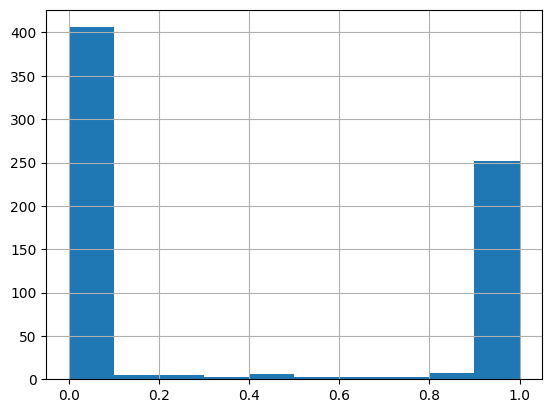

In [45]:
input_amt = 25

plot_df['proba'] = make_prediction(plot_df, input_amt)
print('mean proba: ', plot_df['proba'].mean())
plot_df['proba'].hist();

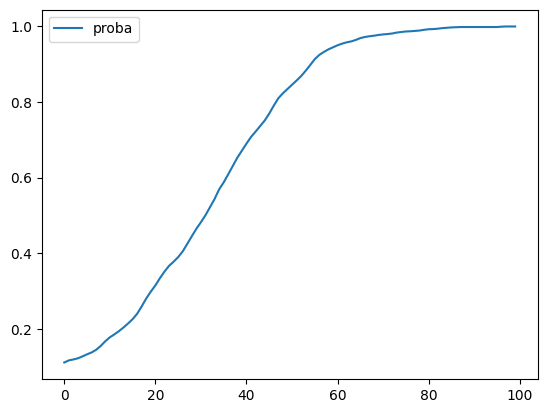

In [46]:
pred_df = pd.DataFrame(columns=['proba'])
for i in range(100):
    pred_df.loc[i, 'proba'] = make_prediction(site_data, i).mean()

pred_df.plot();

might need to start with an input amount / order the functions so that it scaled to whatever the input amount is before user interaction

In [47]:
# MVP
# add plot

from dash import Dash, dcc, html, Input, Output

#app = Dash(__name__)
app = JupyterDash(__name__)

app.layout = html.Div([
    html.H1("Change the value in the text box to see updated probability of Debris Flow"),
    html.Div([
        "Input Upcoming Rain Forecase (mm/h): ",
        #dcc.Input(id='my-input', value='0.0', type='text')
        dcc.Input(id='rain_input', value='10.0', type='number', step="0.1", min=0)
    ]),
    html.Br(),
    html.Div([
        dcc.Graph(id='map_plot',
        )
    ]),
    #html.Div(id='my_output'),

])

# define initial map function
def create_plot(plot_df): # use the correct data (site_data?)
    fig = px.choropleth_mapbox(
        plot_df,
        plot_df['geometry_simple'],
        locations=plot_df.index,
        color='proba',
        #color_continuous_scale='OrRd',
        #color_continuous_scale='RdBu_r',
        color_continuous_scale='Blackbody_r',
        hover_data=['SiteID'],
        center=map_center,
        mapbox_style='stamen-terrain',
        height=800,
        zoom=7,
        opacity=0.5 
)
    #fig.show(render)
    return fig#.show(render) # potentially remove .show()

def make_prediction(plot_df, rain_input):
    input_amount = rain_input
    rain_input = np.repeat(input_amount, site_data.shape[0])
    rain_input_scaled = (rain_input - rain_scaler_mean) / rain_scaler_std
    # now replace with the scaled input
    X_scaled.loc[:,col_idx] = rain_input_scaled
    
    # and make prediction with the new rain amount
    X_scaled_tensor = torch.tensor(X_scaled.values).float().to(device)
    y_pred_tensor = model(X_scaled_tensor) # already sent to device when instantiated
    # predicted probability
    y_pred_proba = y_pred_tensor.detach().cpu().numpy().astype(np.float16) # smaller dtype
    # in case you want the binary output
    #y_pred_bool = np.round(y_pred_proba)
    
    '''
    not sure which is needed for the app
    '''
    return y_pred_proba
    
    #plot_df['proba'] = y_pred_proba
    #return plot_df
    
@app.callback(
    #Output(component_id='my_output', component_property='children'),
    Output(component_id='map_plot', component_property='figure'),
    Input(component_id='rain_input', component_property='value')
)

def display_map(input_value):
    return create_plot(plot_df)

# def update_proba(input_value):
#     plot_df['proba'] = make_prediction(plot_df, input_value)
#     return plot_df


if __name__ == '__main__':
    app.run_server(
        debug=True,
        mode='inline',
        #host='localhost',
        port=8090,
        #dev_tools_ui=True, 
        #dev_tools_hot_reload=True, 
        #threaded=True,
    )
#webbrowser.open("http://127.0.0.1:8050/") # to save a click

Dash is running on http://127.0.0.1:8090/



## MVP <a id="mvp>">

In [48]:
# MVP

from dash import Dash, dcc, html, Input, Output

#app = Dash(__name__)
app = JupyterDash(__name__)

app.layout = html.Div([
    html.H1("Change the value in the text box to see updated probability of Debris Flow"),
    html.Div([
        "Input Upcoming Rain Forecase (mm/h): ",
        #dcc.Input(id='my-input', value='0.0', type='text')
        dcc.Input(id='rain_input', value='1', type='number', step="1", min=0)
    ]),
    html.Br(),
    html.Div([
        dcc.Graph(id='map_plot',
        )
    ]),
    #html.Div(id='my_output'),

])


# define initial map function
def create_plot(plot_df): # use the correct data (site_data?)
       
    # create the plot with our new proba
    fig = px.choropleth_mapbox(
        plot_df,
        plot_df['geometry_simple'],
        locations=plot_df.index,
        color='proba',
        #color_continuous_scale='OrRd',
        #color_continuous_scale='RdBu_r',
        color_continuous_scale='Blackbody_r',
        hover_data=['SiteID'],
        center=map_center,
        mapbox_style='stamen-terrain',
        height=800,
        zoom=7,
        opacity=0.5,
        #uirevision=True
)
    #fig.show(render)
    return fig#.show(render) # potentially remove .show()

    fig.update_layout(
        #uirevision='true',
        uirevision=True,
    )

    
@app.callback(
    #Output(component_id='my_output', component_property='children'),
    Output(component_id='map_plot', component_property='figure'),
    Input(component_id='rain_input', component_property='value')
)

def display_map(input_value):
    # fit the scaler on the input
    rain_input = pd.to_numeric(np.repeat(input_value, site_data.shape[0]))
    rain_input_scaled = (rain_input - rain_scaler_mean) / rain_scaler_std
    # now replace with the scaled input
    X_scaled.loc[:,col_idx] = rain_input_scaled
    # and make prediction with the new rain amount
    X_scaled_tensor = torch.tensor(X_scaled.values).float().to(device)
    y_pred_tensor = model(X_scaled_tensor) # already sent to device when instantiated
    # predicted probability
    y_pred_proba = y_pred_tensor.detach().cpu().numpy().astype(np.float16) # smaller dtype
    # in case you want the binary output for something
    #y_pred_bool = np.round(y_pred_proba)
    plot_df['proba'] = y_pred_proba
    
    return create_plot(plot_df)

if __name__ == '__main__':
    app.run_server(
        debug=True,
        mode='inline',
        #host='localhost',
        port=8090,
        #dev_tools_ui=True, 
        #dev_tools_hot_reload=True, 
        #threaded=True,
    )
#webbrowser.open("http://127.0.0.1:8050/") # to save a click

Dash is running on http://127.0.0.1:8090/



In [289]:
help(fig)

Help on Figure in module plotly.graph_objs._figure object:

class Figure(plotly.basedatatypes.BaseFigure)
 |  Figure(data=None, layout=None, frames=None, skip_invalid=False, **kwargs)
 |  
 |  Method resolution order:
 |      Figure
 |      plotly.basedatatypes.BaseFigure
 |      builtins.object
 |  
 |  Methods defined here:
 |  
 |  __init__(self, data=None, layout=None, frames=None, skip_invalid=False, **kwargs)
 |      Create a new :class:Figure instance
 |      
 |      Parameters
 |      ----------
 |      data
 |          The 'data' property is a tuple of trace instances
 |          that may be specified as:
 |            - A list or tuple of trace instances
 |              (e.g. [Scatter(...), Bar(...)])
 |            - A single trace instance
 |              (e.g. Scatter(...), Bar(...), etc.)
 |            - A list or tuple of dicts of string/value properties where:
 |              - The 'type' property specifies the trace type
 |                  One of: ['bar', 'barpolar', 